# This Notebook is to do the GMM classification

# Load training data

In [1]:
# define the path of the data and project
training_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/training_data/'

In [2]:
# load the training data
import xarray as xr

ds_train_750_latlonT_5_60_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_60_95.nc')
ds_train_750_latlonT_5_60_95['profiler']=ds_train_750_latlonT_5_60_95['profiler'].astype(str)
ds_train_750_latlonT_5_50_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_50_95.nc')
ds_train_750_latlonT_5_50_95['profiler']=ds_train_750_latlonT_5_50_95['profiler'].astype(str)
ds_train_750_latlonT_5_70_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_70_95.nc')
ds_train_750_latlonT_5_70_95['profiler']=ds_train_750_latlonT_5_70_95['profiler'].astype(str)

ds_train_250_latlonT_10_20_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_20_95.nc')
ds_train_250_latlonT_10_20_95['profiler']=ds_train_250_latlonT_10_20_95['profiler'].astype(str)
ds_train_250_latlonT_10_10_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_10_95.nc')
ds_train_250_latlonT_10_10_95['profiler']=ds_train_250_latlonT_10_10_95['profiler'].astype(str)
ds_train_250_latlonT_10_30_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_30_95.nc')
ds_train_250_latlonT_10_30_95['profiler']=ds_train_250_latlonT_10_30_95['profiler'].astype(str)

# Load the data do classification (fitting data)

In [3]:
# define the path of the data and project
data_path = 'D:/VScode/MRes/scienceweb.whoi.edu/itp/data/'

In [4]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_750=xr.open_dataset(f"{data_path}/ds_cleaned_750.nc")
# convert the profile data to string
ds_cleaned_750['profiler']=ds_cleaned_750['profiler'].astype(str)

In [5]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_250=xr.open_dataset(f"{data_path}/ds_cleaned_250.nc")
# convert the profile data to string
ds_cleaned_250['profiler']=ds_cleaned_250['profiler'].astype(str)
ds_cleaned_250=ds_cleaned_250.where(ds_cleaned_250['lat']>60,drop=True)

# Functions to do the GMM using pyxpcm

In [28]:
import prepare_training_data_functions as ptd

def GMM_pipeline(ds, lat_step, lon_step, quantile4T=0.95, K=4):
    """
    Function to perform a GMM pipeline.

    Input Parameters:
        - ds: The input dataset.
        - lat_step: The latitude step size for preparing training data.
        - lon_step: The longitude step size for preparing training data.
        - quantile4T: The quantile value for preparing training data (default: 0.95).
        - K: The number of components in the GMM (default: 4).

    Output Parameters:
        - ds_fit_latlonT: The fitted dataset after GMM and post-processing.
        - m_latlonT: The trained PCM model.
    """
    ds_train_latlonT = ptd.prepare_training_data(lat_step, lon_step, quantile4T, ds)
    ds_fit_latlonT, m_latlonT = GMM(ds_train_latlonT, ds.copy(), K)
    return ds_fit_latlonT, m_latlonT


#################################################################################################

from pyxpcm.models import pcm
import numpy as np

def GMM(ds_train, ds_fit, K):
    """
    Function to perform Gaussian Mixture Model (GMM) fitting.

    Input Parameters:
        - ds_train: The training dataset.
        - ds_fit: The dataset to fit the GMM.
        - K: The number of components in the GMM.

    Output Parameters:
        - ds_fit: The fitted dataset after GMM and post-processing.
        - m: The trained PCM model.
    """
    ds_fit=ds_fit.copy()
    
    if np.max(ds_train.pressure) >= 0:
        print('Warning, the pressure is not negative!!!')
    pstart = np.max(ds_train.pressure)
    pend = np.min(ds_train.pressure)
    z = np.arange(pstart, pend, -10.)

    pcm_features = {'temperature': z, 'salinity': z}
    m = pcm(K=K, features=pcm_features, maxvar=2)

    features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}

    m.fit(ds_train, features=features_in_ds, dim='pressure')
    ds_fit = m.predict(ds_fit, features=features_in_ds, dim='pressure', inplace=True)

    ds_fit = post_processing(ds_fit, ds_train, m)

    return ds_fit, m


#################################################################################################
def post_processing(ds_fit, ds_train, m):
    """
    Function to perform post-processing on the fitted dataset.

    Input Parameters:
        - ds_fit: The fitted dataset after GMM.
        - ds_train: The training dataset used for fitting.
        - m: The trained PCM model.

    Output Parameters:
        - ds_fit: The post-processed fitted dataset.
    """
    ds_fit['lat_step'] = ds_train['lat_step']
    ds_fit['lon_step'] = ds_train['lon_step']
    ds_fit['quantile4T'] = ds_train['quantile4T']
    ds_fit['nprof_of_train'] = ds_train.nprof.size

    features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
    m.predict_proba(ds_fit, features=features_in_ds, dim='pressure', inplace=True)

    for vname in ds_fit.data_vars:
        try:
            del ds_fit[vname].attrs['_pyXpcm_cleanable']
        except:
            print(f'{vname} has no _pyXpcm_cleanable attribute, skip it')


    return ds_fit

# Train the model and fit the data

In [28]:
ds_fit_750_latlonT_5_60_95_k4,m_750_latlonT_5_60_95_k4=GMM(ds_train_750_latlonT_5_60_95,ds_cleaned_750,4) #GMM_pipeline(ds_cleaned_750,5,60,0.95,4)

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it


# Functions to plot results

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.colors import ListedColormap

def plot_labels(ds, show_title=False)-> None:
    """
    Plot labels on a map.

    Args:
        ds: The input dataset.
        show_title (bool): Whether to show the title. Default is False.
    """

    # Get the unique labels
    unique_labels = np.unique(ds.PCM_LABELS.values)
    num_labels = len(unique_labels)

    fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution='l', ax=ax)

    m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
    m.drawcoastlines()
    m.fillcontinents(color='grey', lake_color='lightblue')
    m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)

    # Define your own color list
    color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple'] 
    cmap = ListedColormap(color_list)

    x, y = m(ds['lon'], ds['lat'])
    sc = m.scatter(x, y, s=3, c=ds.PCM_LABELS.values, cmap=cmap, vmin=0, vmax=num_labels-1)

    cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
    cbar.ax.set_ylabel('class')
    cbar.set_ticks(np.arange(0, num_labels, 1))

    # Add a title and set the font size
    if show_title:
        plt.title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}, quantile4T={ds.quantile4T.values},nprof_of_train={ds.nprof_of_train.values}')

    for lat in np.arange(lat_min, lat_max + 1, lat_step):
        if lat < 80:
            x, y = m(0, lat+1)
        else:
            x, y = m(0, lat)

        ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
                bbox=dict(facecolor='w', edgecolor='None', alpha=1))

    plt.show()



#########################################################################################
import matplotlib.pyplot as plt

def plot_mean_profile_allinone(ds_fit)-> None:
    
    """
    Plot mean profile for each class in a single figure.

    Args:
        ds_fit: The input dataset.
    """

    unique_labels = np.unique(ds_fit.PCM_LABELS.values)
    num_classes = len(unique_labels)

    fig, axs = plt.subplots(1, 2, figsize=(8, 6), dpi=300)
    color_list = ['red', 'saddlebrown', 'deepskyblue',  'purple']  # Define your own color list

    for i in range(num_classes):
        ds_class = ds_fit.where(ds_fit.PCM_LABELS == i, drop=True)

        qua5_temp = np.quantile(ds_class['temperature'], 0.05, axis=0)
        qua95_temp = np.quantile(ds_class['temperature'], 0.95, axis=0)
        qua50_temp = np.quantile(ds_class['temperature'], 0.50, axis=0)

        qua5_salinity = np.quantile(ds_class['salinity'], 0.05, axis=0)
        qua95_salinity = np.quantile(ds_class['salinity'], 0.95, axis=0)
        qua50_salinity = np.quantile(ds_class['salinity'], 0.50, axis=0)

        ax = axs[0]
        ax.plot(qua50_temp, ds_fit['pressure'].values, c=color_list[i], label=f'Class {i}')
        ax.fill_betweenx(ds_fit['pressure'].values, qua5_temp, qua95_temp, color=color_list[i], alpha=0.5)
        ax.legend(loc='lower left')
        ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
        ax.set_ylabel('Pressure')
        ax.set_xlabel('Temperature')

        ax = axs[1]
        ax.plot(qua50_salinity, ds_fit['pressure'].values, c=color_list[i], label=f'Class {i}')
        ax.fill_betweenx(ds_fit['pressure'].values, qua5_salinity, qua95_salinity, color=color_list[i], alpha=0.5)
        ax.set_ylim([np.min(ds_fit['pressure'].values), np.max(ds_fit['pressure'].values)])
        # ax.legend(loc='lower left')
        # ax.set_ylabel('Pressure')
        ax.set_ylabel('')
        ax.set_xlabel('Salinity')

    plt.show()

#########################################################################################


import matplotlib.pyplot as plt
import numpy as np

def plot_mean_profile(ds_fit)-> None:
    """
    Plot mean profile for each class in separate subplots.

    Args:
        ds_fit: The input dataset.
    """

    unique_labels = np.unique(ds_fit.PCM_LABELS.values)
    num_classes = len(unique_labels)
    num_rows = 2  # Calculate the number of rows
    num_cols = num_classes  

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 5 * num_rows), dpi=300)

    for i in range(num_classes):

        ds_class = ds_fit.where(ds_fit.PCM_LABELS == i, drop=True)

        ax=axs[0,i]
        qua5 = np.quantile(ds_class['temperature'], 0.05, axis=0)
        qua95 = np.quantile(ds_class['temperature'], 0.95, axis=0)
        qua50 = np.quantile(ds_class['temperature'], 0.50, axis=0)

        ax.plot(qua5, ds_fit['pressure'].values, c='b', label=0.05)
        ax.plot(qua50, ds_fit['pressure'].values, c='r', label=0.50)
        ax.plot(qua95, ds_fit['pressure'].values, c='g', label=0.95)
        ax.grid(True)
        ax.legend()
        ax.set_title(f'Class {i}')

        ax.set_ylabel('Pressure')
        ax.set_xlabel('Temperature')

        # plot the salinity
        ax=axs[1,i]

        qua5 = np.quantile(ds_class['salinity'], 0.05, axis=0)
        qua95 = np.quantile(ds_class['salinity'], 0.95, axis=0)
        qua50 = np.quantile(ds_class['salinity'], 0.50, axis=0)

        ax.plot(qua5, ds_fit['pressure'].values, c='b', label=0.05)
        ax.plot(qua50, ds_fit['pressure'].values, c='r', label=0.50)
        ax.plot(qua95, ds_fit['pressure'].values, c='g', label=0.95)

        ax.grid(True)
        ax.legend()
        ax.set_title(f'Class {i}')

        ax.set_ylabel('Pressure')
        ax.set_xlabel('Salinity')

    plt.subplots_adjust(wspace=0.5, hspace=0.25)
    plt.show()

###############################################################################
# plot the likelihood of each class
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def plot_single_class_prob(ds)-> None:
    """
    Plot the probability of each class.

    Args:
        ds: The input dataset.
    """

    nrows = np.ceil(ds.PCM_POST.shape[0] / 2).astype(int)
    fig, axs = plt.subplots(nrows, 2, figsize=(8, 4 * nrows), dpi=300)

    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    lat_step = 10
    lon_step = 20

    fig.subplots_adjust(hspace=0)  # Adjust the vertical spacing between subplots

    for i in range(ds.PCM_POST.values.shape[0]):
        ax = axs[i // 2, i % 2]
        m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution='l', ax=ax)

        m.drawparallels(np.arange(lat_min, lat_max + 1, lat_step), labels=[], linewidth=0.1)
        m.drawcoastlines()
        m.fillcontinents(color='grey', lake_color='lightblue')
        if i==0:
            m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), labels=[1, 0, 0, 1], linewidth=0.1)
        else:
            m.drawmeridians(np.arange(lon_min, lon_max + 1, lon_step), linewidth=0.1)

        pcm_post = ds.PCM_POST.values[i, :]
        x, y = m(ds['lon'], ds['lat'])
        # pcm_post[pcm_post < 0.4] = 0.05

        sc = m.scatter(x, y, s=3, c=np.array([pcm_post]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))
        # plot the pcm_post larger than 0.5
        m.scatter(x[pcm_post > 0.5], y[pcm_post > 0.5], s=3, c=np.array([pcm_post[pcm_post > 0.5]]), cmap='Blues', vmin=0, vmax=np.max(pcm_post))

        cbar = plt.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
        if i==3:
            
            cbar.ax.set_ylabel('Probability')
            # add a title and set the font size
        ax.set_title(f'probability of class {i}', fontsize=12)

        # # add latitude labels
        # for lat in np.arange(lat_min, lat_max + 1, lat_step):
        #     if lat < 80:
        #         x, y = m(0, lat+1)
        #     else:
        #         x, y = m(0, lat)
                
        #     ax.text(x, y, f'{lat}°N', fontsize=8, ha='center', va='center', color='k',
        #             bbox=dict(facecolor='w', edgecolor='None', alpha=1))

    plt.show()

#########################################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_san_temp_profiles(ds, sequence = [3, 1, 0, 2])-> None:
    """
    Plot salinity-temperature profiles for each class.

    Args:
        ds: The input dataset.
    """

    unique_labels = np.unique(ds.PCM_LABELS.values)
    num_labels = len(unique_labels)

    if num_labels != 4:
        print('The number of unique labels is not 4, please check the input ds')
        return

    color_list = ['red', 'saddlebrown', 'deepskyblue', 'purple']  # Define your own color list
    cmap = ListedColormap(color_list)

    # Create a figure
    fig = plt.figure(figsize=(6, 6), dpi=300)

    symbols = ['o', 's', '^', 'd']

    # Loop over the classes
    for i in sequence:
        # Get the data of each class
        ds_class = ds.where(ds.PCM_LABELS == i, drop=True)
        
        # Plot the salinity-temperature profiles of each class
        plt.plot(ds_class['salinity'].values.T, ds_class['temperature'].values.T, c=cmap(i), alpha=1)
        plt.plot(
            ds_class['salinity'].values[0],
            ds_class['temperature'].values[0],
            c=cmap(i),
            label=f'class {i}',
            alpha=1
        )

    for i in sequence:
        # Get the data of each class
        ds_class = ds.where(ds.PCM_LABELS == i, drop=True)
        # Plot the mean profile on top
        plt.plot(
            ds_class['salinity'].mean(dim='nprof'),
            ds_class['temperature'].mean(dim='nprof'),
            c='k',
            marker=symbols[i],
            markersize=3,
            label=f'mean of class {i}',
            alpha=1
        )

    plt.legend()
    plt.xlabel('Salinity')
    plt.ylabel('Temperature (°C)')

    plt.show()

# Label distribution

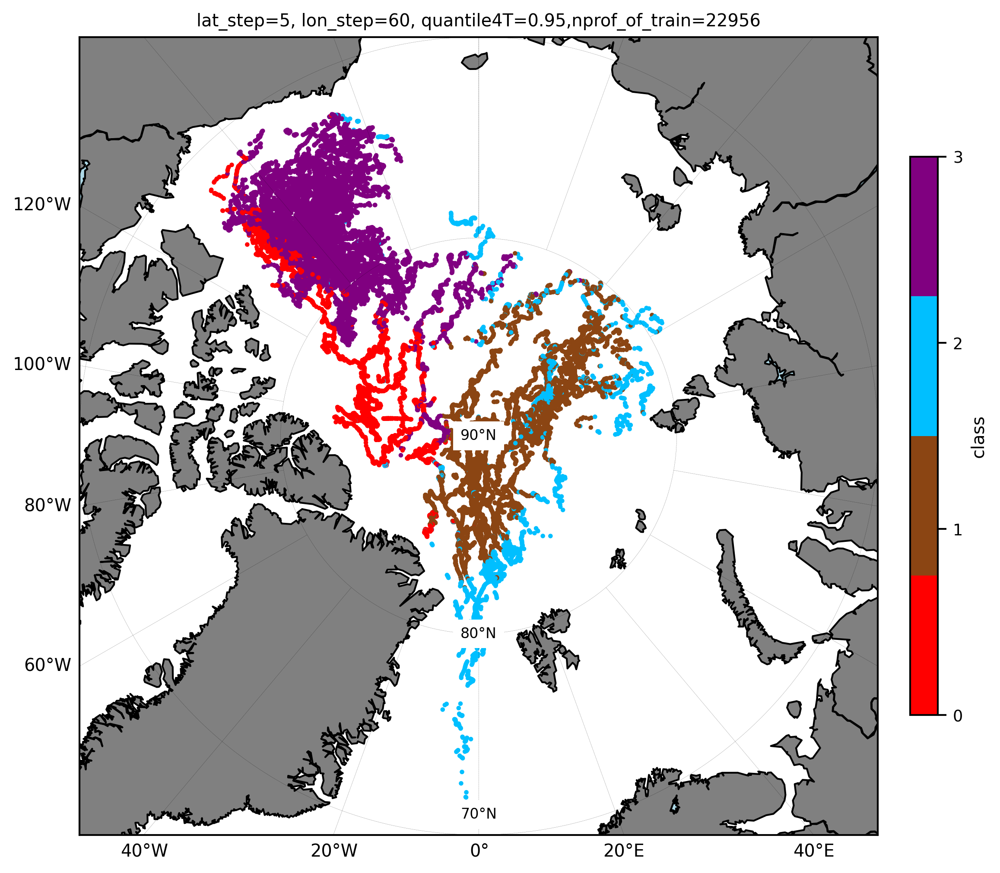

In [29]:
plot_labels(ds_fit_750_latlonT_5_60_95_k4,show_title=True)

# Mean profile

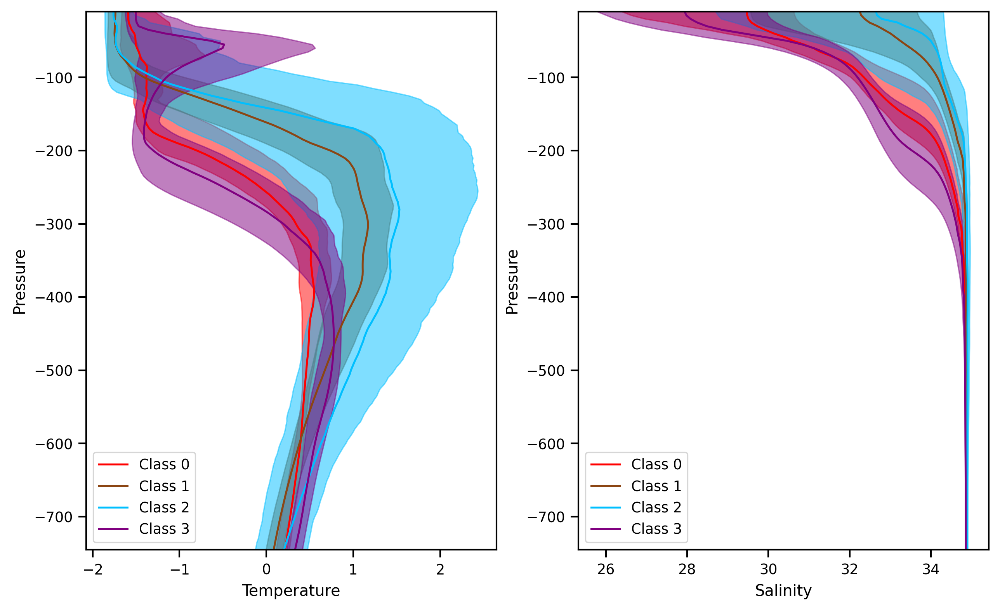

In [37]:
plot_mean_profile_allinone(ds_fit_750_latlonT_5_60_95_k4)

# Plot the probablity of the profile belong to a specific class

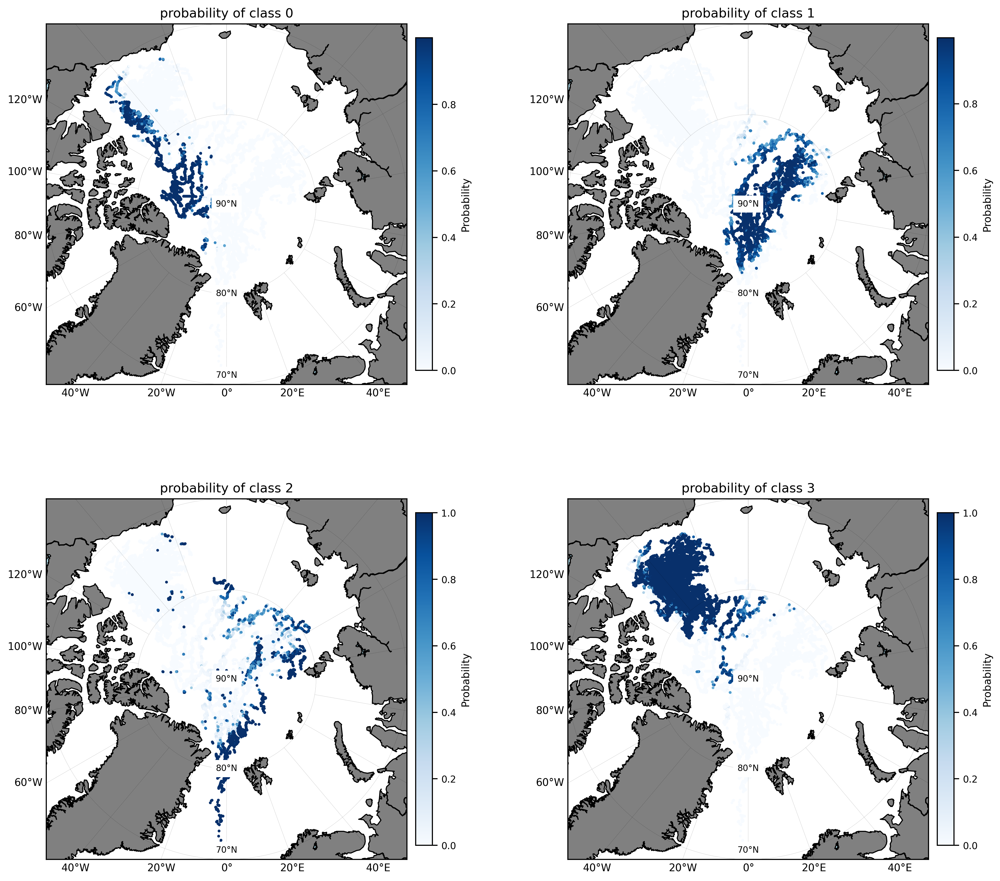

In [34]:
plot_single_class_prob(ds_fit_750_latlonT_5_60_95_k4)

# Plot the Temperature-Salinity profile

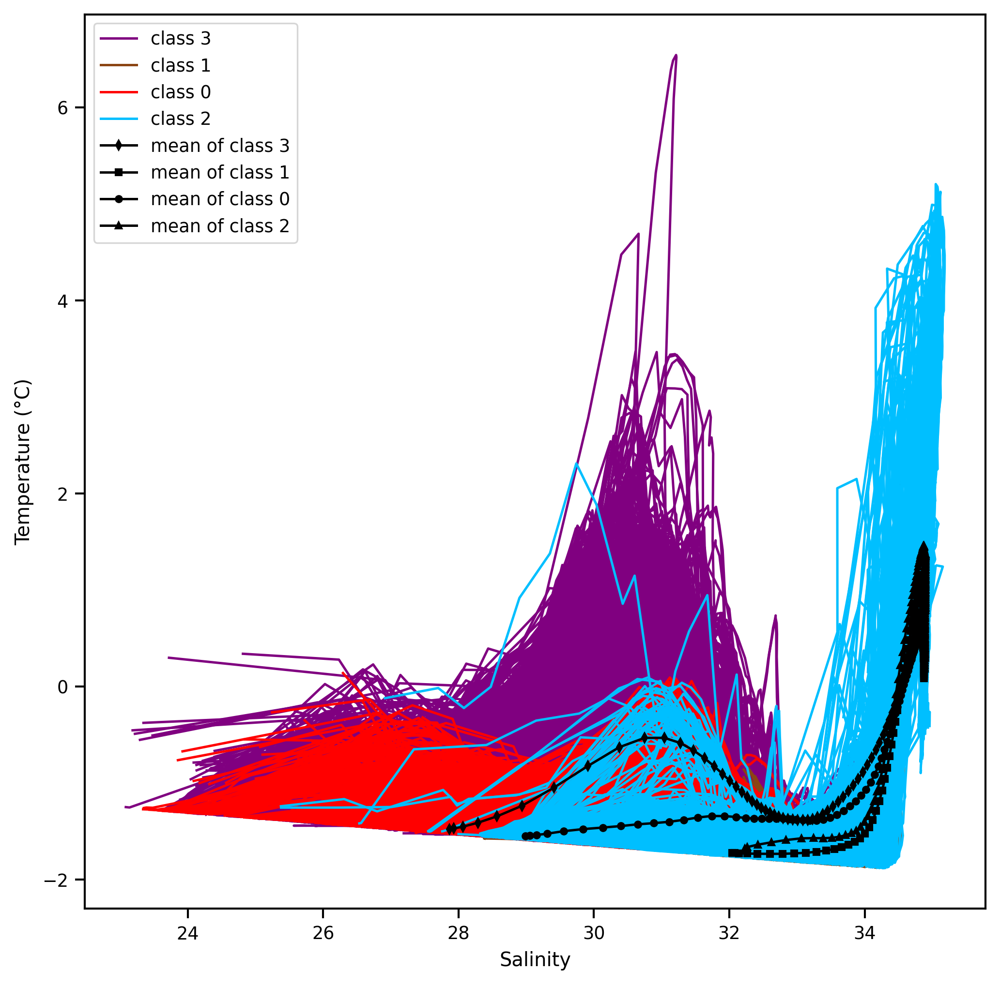

In [38]:
plot_san_temp_profiles(ds_fit_750_latlonT_5_60_95_k4)

# Do the same to the 250 data

In [8]:
ds_fit_250_latlonT_10_20_95_k4,m_250_latlonT_10_20_95_k4=GMM(ds_train_250_latlonT_10_20_95,ds_cleaned_250,4) 

temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it


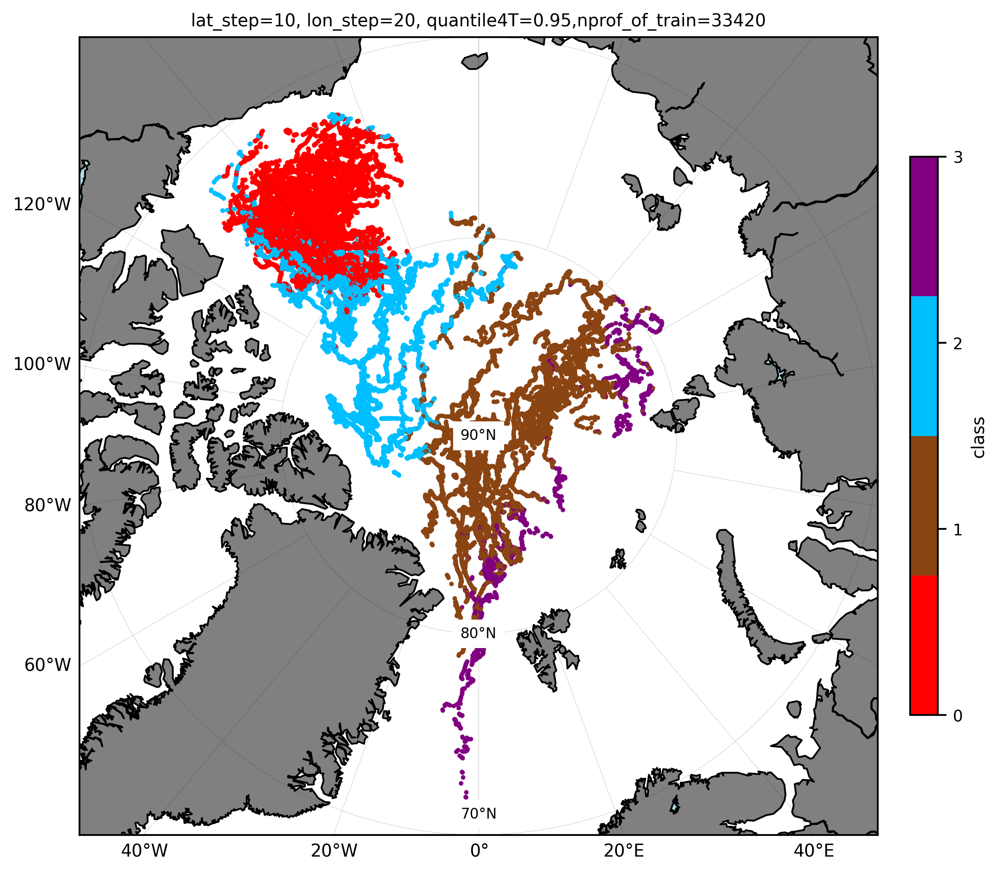

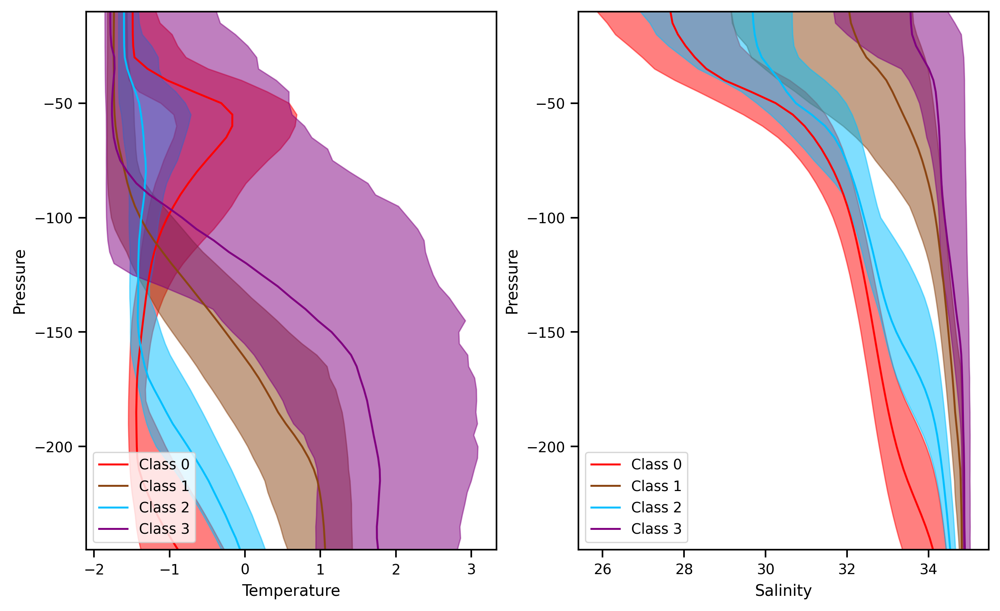

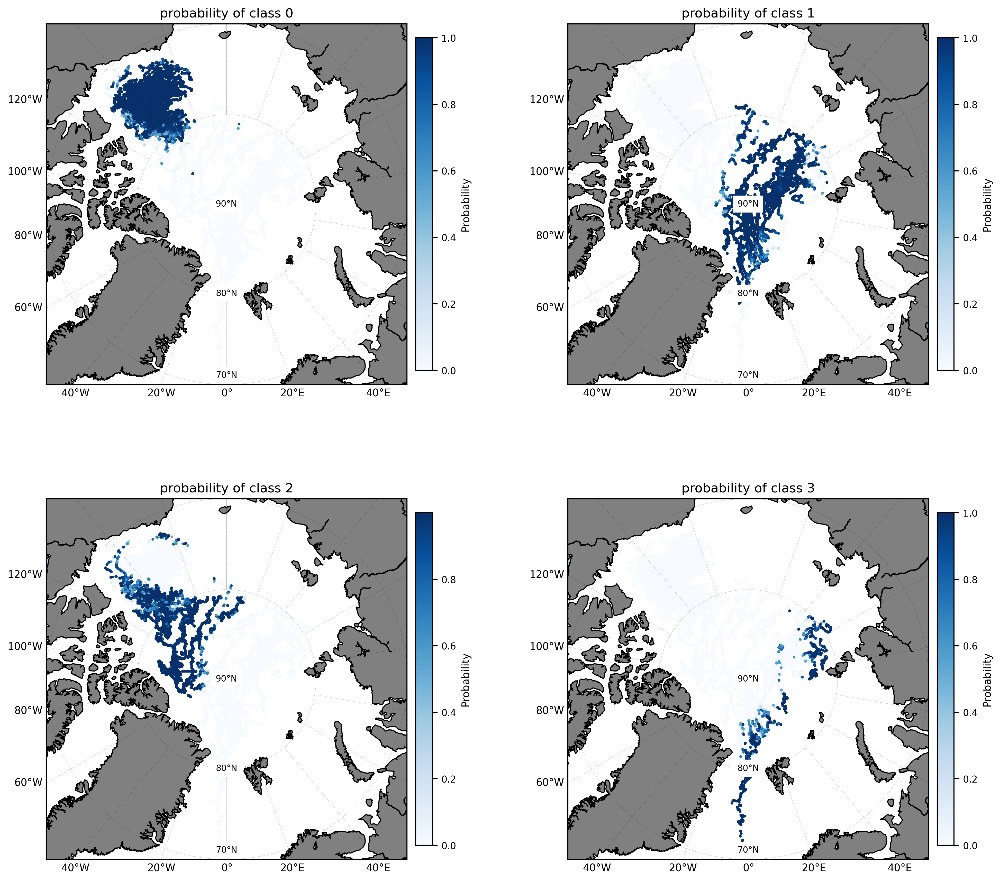

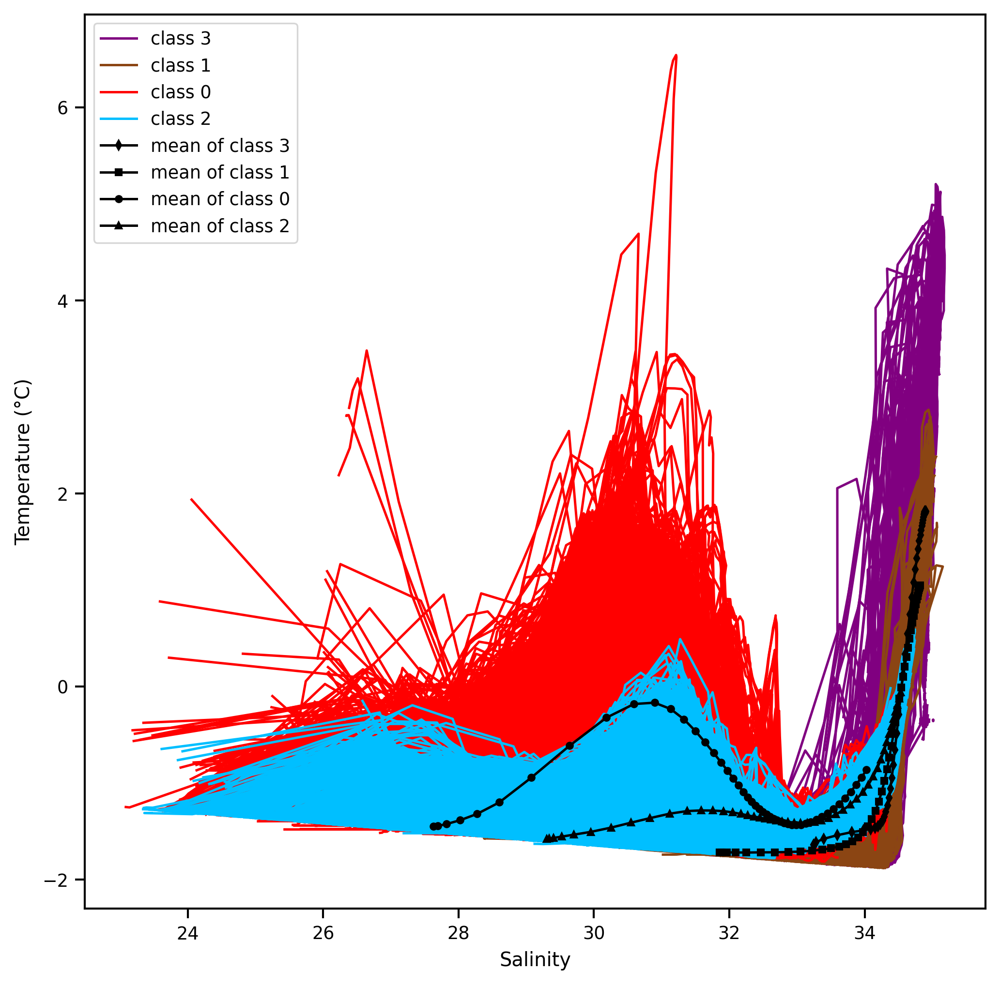

In [10]:
plot_labels(ds_fit_250_latlonT_10_20_95_k4,show_title=True)
plot_mean_profile_allinone(ds_fit_250_latlonT_10_20_95_k4)
plot_single_class_prob(ds_fit_250_latlonT_10_20_95_k4)
plot_san_temp_profiles(ds_fit_250_latlonT_10_20_95_k4)

# Generate results for all training data

In [29]:

ds_fit_750_latlonT_5_60_95_k4,m_750_latlonT_5_60_95_k4=GMM(ds_train_750_latlonT_5_60_95,ds_cleaned_750,4)
ds_fit_750_latlonT_5_50_95_k4,m_750_latlonT_5_50_95_k4=GMM(ds_train_750_latlonT_5_50_95,ds_cleaned_750,4)
ds_fit_750_latlonT_5_70_95_k4,m_750_latlonT_5_70_95_k4=GMM(ds_train_750_latlonT_5_70_95,ds_cleaned_750,4)

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))
d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_POST variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it


d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))
d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_POST variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it


d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it


d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_POST variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


In [34]:
# save the fitted data to local file
path='D:/VScode/MRes/Clustering_under_the_ice/fitted_data/'
ds_fit_750_latlonT_5_60_95_k4.to_netcdf(path+'ds_fit_750_latlonT_5_60_95_k4.nc')
ds_fit_750_latlonT_5_50_95_k4.to_netcdf(path+'ds_fit_750_latlonT_5_50_95_k4.nc')
ds_fit_750_latlonT_5_70_95_k4.to_netcdf(path+'ds_fit_750_latlonT_5_70_95_k4.nc')

In [37]:
ds_fit_250_latlonT_10_20_95_k4,m_250_latlonT_10_20_95_k4=GMM(ds_train_250_latlonT_10_20_95,ds_cleaned_250,4)
ds_fit_250_latlonT_10_10_95_k4,m_250_latlonT_10_10_95_k4=GMM(ds_train_250_latlonT_10_10_95,ds_cleaned_250,4)
ds_fit_250_latlonT_10_30_95_k4,m_250_latlonT_10_30_95_k4=GMM(ds_train_250_latlonT_10_30_95,ds_cleaned_250,4)

temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it
temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip it
lon_step has no _pyXpcm_cleanable attribute, skip it
quantile4T has no _pyXpcm_cleanable attribute, skip it
nprof_of_train has no _pyXpcm_cleanable attribute, skip it
temperature has no _pyXpcm_cleanable attribute, skip it
salinity has no _pyXpcm_cleanable attribute, skip it
dissolved_oxygen has no _pyXpcm_cleanable attribute, skip it
lat_step has no _pyXpcm_cleanable attribute, skip 

In [40]:
# save the fitted data to local file
path='D:/VScode/MRes/Clustering_under_the_ice/fitted_data/'
ds_fit_250_latlonT_10_20_95_k4.to_netcdf(path+'ds_fit_250_latlonT_10_20_95_k4.nc')
ds_fit_250_latlonT_10_10_95_k4.to_netcdf(path+'ds_fit_250_latlonT_10_10_95_k4.nc')
ds_fit_250_latlonT_10_30_95_k4.to_netcdf(path+'ds_fit_250_latlonT_10_30_95_k4.nc')

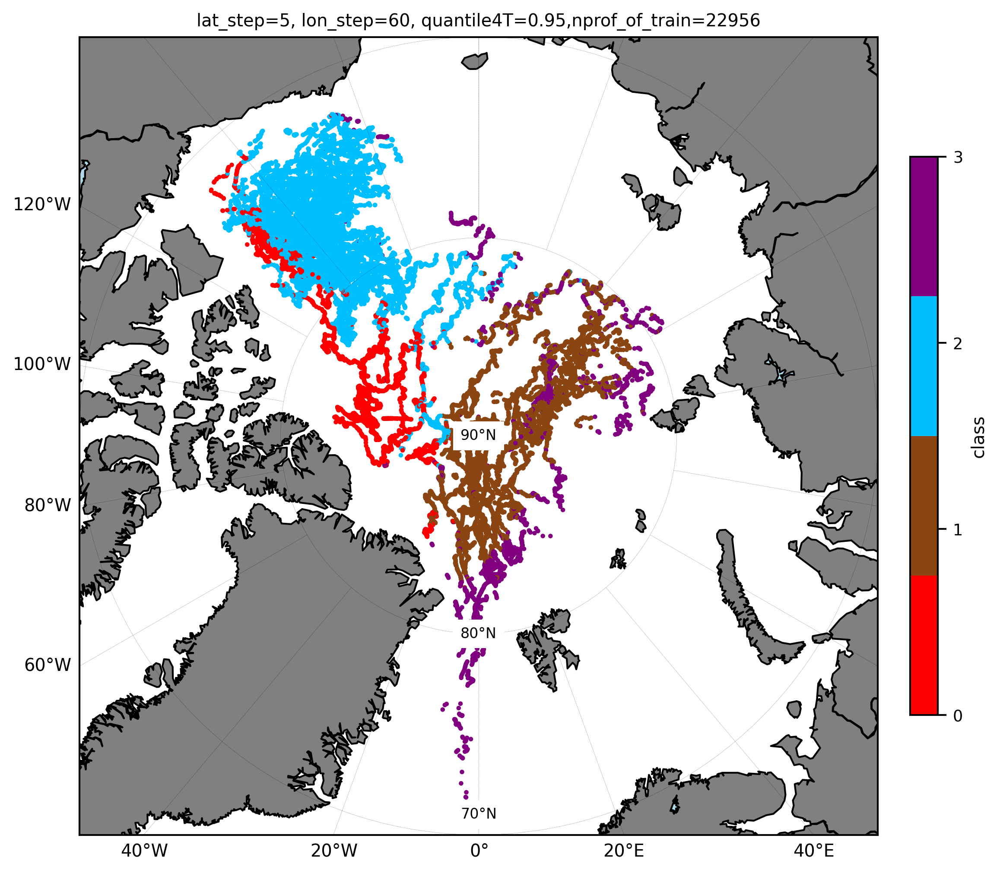

In [47]:
fitted_data_path='D:/VScode/MRes/Clustering_under_the_ice/fitted_data/'
ds_fit_750_latlonT_5_60_95_k4=xr.open_dataset(fitted_data_path+'ds_fit_750_latlonT_5_60_95_k4.nc')

plot_labels(ds_fit_750_latlonT_5_60_95_k4,show_title=True)


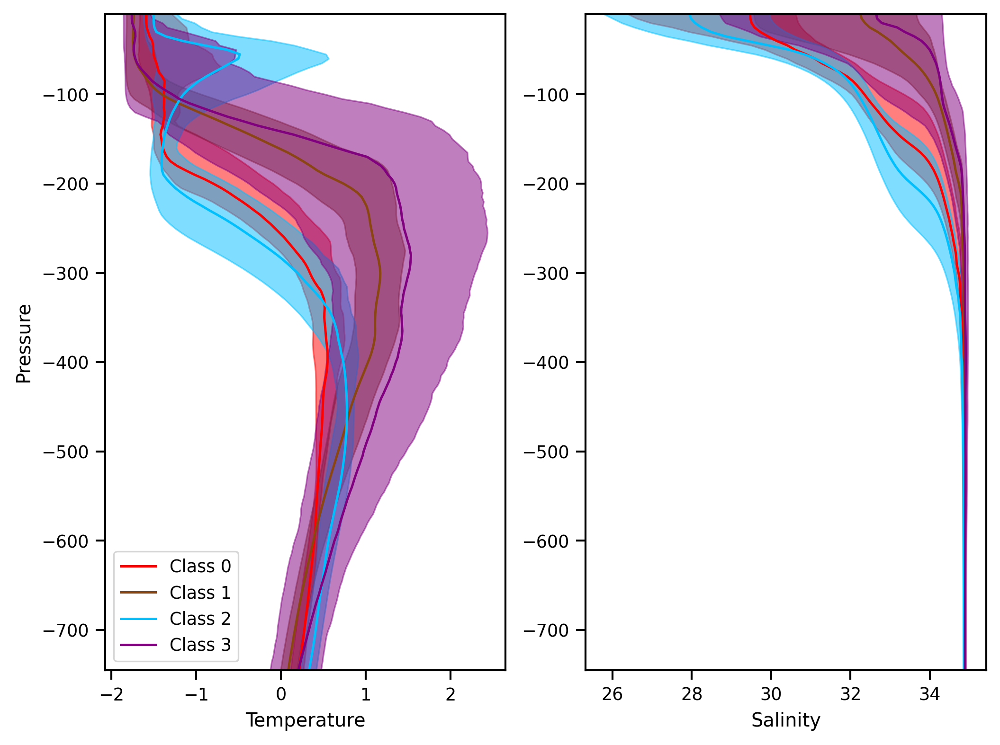

In [67]:
plot_mean_profile_allinone(ds_fit_750_latlonT_5_60_95_k4)


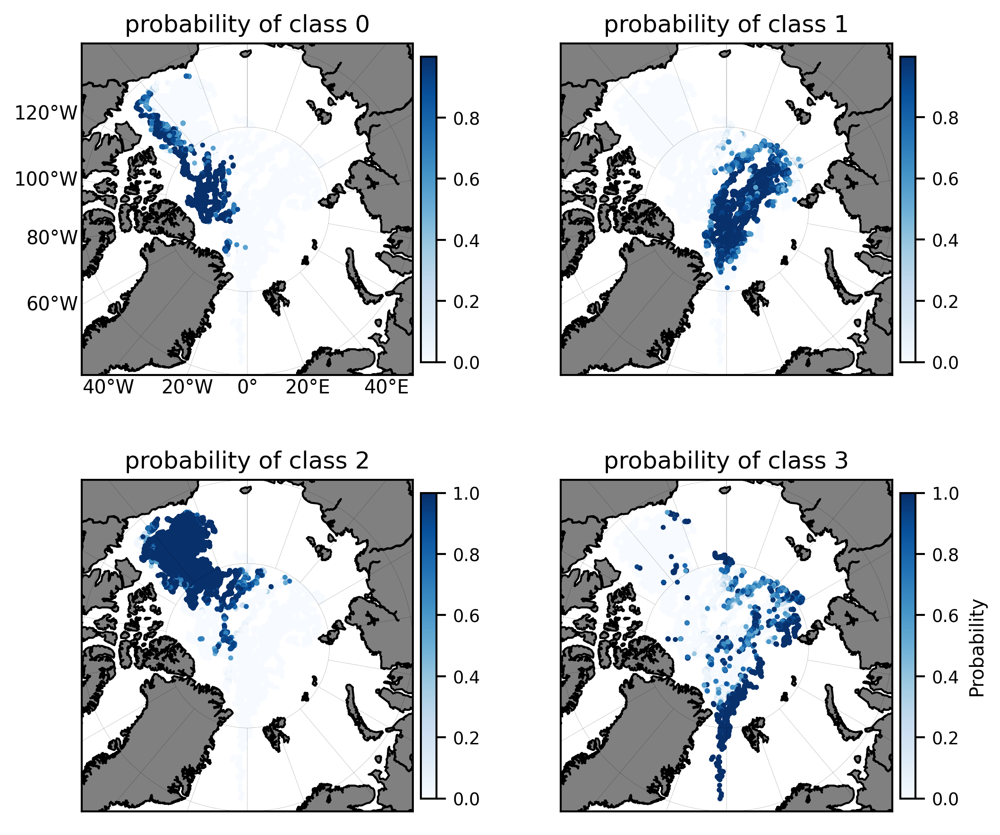

In [65]:
plot_single_class_prob(ds_fit_750_latlonT_5_60_95_k4)


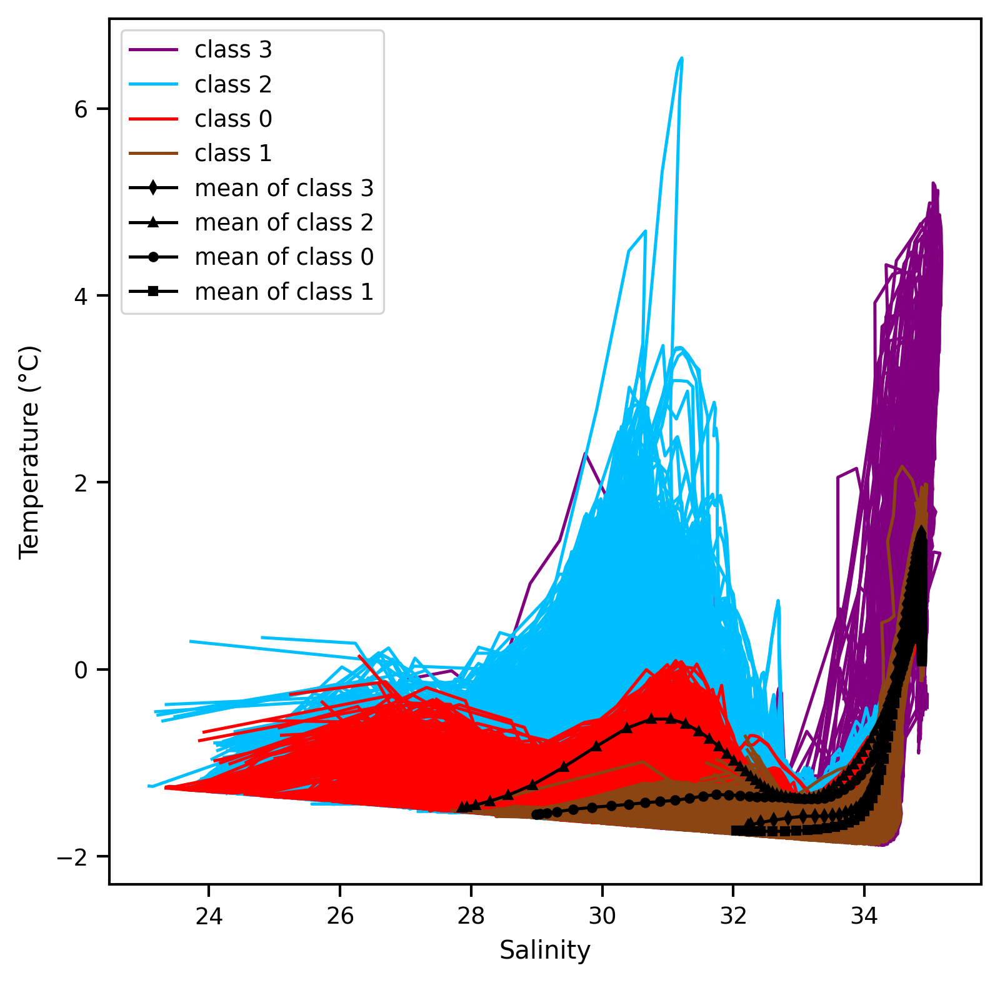

In [50]:
plot_san_temp_profiles(ds_fit_750_latlonT_5_60_95_k4,sequence=[3,2,0,1])